>In this notebook, we will use trained ML model from [part 2](2_Model_training.ipynb) to label dataset from a different [clinical trial](https://physionet.org/physiobank/database/apnea-ecg/) that was obtained using different equipment. This way we will simulate validation of new equipment against gold standard.

# Content:
- [Import of libraries](#Import-of-libraries)
- [Extracting New Data](#Extracting-New-Data)
- [Loading Trained Model](#Loading-Trained-Model)
- [Making Predictions and Plotting Results](#Making-Predictions-and-Plotting-Results)
- [Plotting Errors](#Plotting-Errors)

# Import of libraries

In [1]:
# Import of libraries for working with the data
from utils_apnea import *
%matplotlib inline
%load_ext watermark
%watermark

Using TensorFlow backend.


2019-04-08T02:34:02-04:00

CPython 3.6.8
IPython 6.4.0

compiler   : GCC 7.3.0
system     : Linux
release    : 4.15.0-46-generic
machine    : x86_64
processor  : x86_64
CPU cores  : 16
interpreter: 64bit


In [2]:
%watermark --iversions

pandas     0.23.1
numpy      1.14.5
keras      2.2.0
tensorflow 1.9.0
matplotlib 3.0.2
wfdb       2.0.2



In [3]:
!nvidia-smi

Mon Apr  8 02:34:52 2019       
+-----------------------------------------------------------------------------+
| NVIDIA-SMI 390.30                 Driver Version: 390.30                    |
|-------------------------------+----------------------+----------------------+
| GPU  Name        Persistence-M| Bus-Id        Disp.A | Volatile Uncorr. ECC |
| Fan  Temp  Perf  Pwr:Usage/Cap|         Memory-Usage | GPU-Util  Compute M. |
|===============================+======================+======================|
|   0  GeForce GTX 108...  Off  | 00000000:01:00.0 Off |                  N/A |
|  0%   28C    P5    38W / 275W |      0MiB / 11177MiB |      2%      Default |
+-------------------------------+----------------------+----------------------+
                                                                               
+-----------------------------------------------------------------------------+
| Processes:                                                       GPU Memory |
|  GPU  

--------------------------

# Extracting New Data

In [4]:
# Challenge name/location for wfdb package (https://github.com/MIT-LCP/wfdb-python), if data will be pulled from the web directly
challenge_name = 'apnea-ecg'
records_ids    = ['a01r','a02r','a03r','a04r','b01r','c02r', 'c01r', 'c03r']

In [5]:
# Available channels/signals
sig_names = {'Resp C':0, 'Resp A':1, 'Resp N':2, 'SpO2':3}
channels=[0,1,3] # 3 signals will be used to train neural network

# Dictionary for labels
apn_dict = {"N":0, "A":1}

In [10]:
# We will need to modify data generator functions for Apnea-ECG data
#-----------------------------------------------------------------------------------------------

# Data and Labels Generator
def generateDataPerPatientApn(patientID, channels = channels, challenge_name=challenge_name):
    """
    Function
    --------
    generateDataPerPatient

    Generate, clean and combine data and labels for each patient in PhysioNet Apnea-ECG database

    Parameters
    ----------
    patientID : str
        from dfCatalog 
        
    channels : list
        if only certain signals are needed ('Resp C':0, 'Resp A':1, 'Resp N':2, 'SpO2':3) 
                                                         
    challenge_name : str
        Name of the challenge from PhysioNet database
   
    Returns
    -------
    df.values : array
        numpy array with signals and labels
        
    fields['n_sig'] : int
        number of signals

    Example
    -------
    >>> trainData, numberOfChannels = generateDataPerPatient(patientID = "a01r", channels = [0,1,3], challenge_name = 'apnea-ecg')
    """
    # Pulling labels from the PhysioNet
    labels = wfdb.rdann(patientID, pb_dir=challenge_name, extension='apn')  
    
    # Pulling signals from the PhysioNet
    signals, fields = wfdb.rdsamp(patientID,pb_dir=challenge_name, channels=channels) 
    
    # Combining apnea labels with signals for binary classification
    #--------------------------------------------------------------------------------------------
    # Loading Labels into DataFrame
    dfL = pd.DataFrame(labels.symbol, index=labels.sample, columns=['all_events'])
    
    # Mapping apnea/RERA events data
    dfL['apnea_rera']  = dfL['all_events'].map(apn_dict)
    
    # Filling NaN data
    dfL['apnea_rera'].fillna(method = 'ffill', inplace=True)
    dfL['apnea_rera'].fillna(value = 0, inplace=True)
    dfLabelsCat = dfL.apnea_rera
    
    # Combining signals with labels and filling gaps
    df = pd.DataFrame(data=signals, columns=fields['sig_name'])
    df = df.join(dfLabelsCat)
    df.fillna(method='ffill', inplace=True)
    df.fillna(value=0, inplace=True)
    return df.values, fields['n_sig']



# For binary classification apneaor normal
def generateArraysApn(trainData, numberOfChannels, bufferSizeInSec, samplingRateInHz, upsample = True):
    """
    Function
    --------
    generateArraysApn

    Splits continuous whole night data into short intervals for classification

    Parameters
    ----------
    trainData : array
        Numpy array of continuous signals and labels
    
    numberOfChannels : int
        Total number of signal channels present in the data
    
    bufferSizeInSec : int
        Size of intervals for classification task in seconds
    
    samplingRateInHz : int
        Input sampling rate in Hz

    upsample : bool
        Over or undersample data to fix imbalanced dataset
    
    Returns
    -------
    x : array
        Numpy array of signals data
    
    y : array
        1D array for binary classification: 0 - Normal interval, 1 - Apnea event
    
    Example
    -------
    >>> xTrain, yTrain = generateArraysApn(trainData, numberOfChannels = 3, bufferSizeInSec = 60, samplingRateInHz = 200)
    """
    
    # Dividing data into intervals of a size bufferSizeInSec
    batch = np.array(trainData[:((trainData.shape[0]//(samplingRateInHz*bufferSizeInSec))*(samplingRateInHz*bufferSizeInSec))]).reshape((-1,samplingRateInHz*bufferSizeInSec,trainData.shape[1]))

    # Spliting data into signals and labels 
    x = np.nan_to_num(batch[:,:,:numberOfChannels])
    y = np.nan_to_num((batch[:,:,numberOfChannels:]).max(axis=1))
    
    # Deleting intervals where SpO2  level dropped signifficantly (below 50 %), likely due to equipment disconnect
    y = np.delete(y, list(set(np.nonzero((x[:,:,-1]<50))[0])), axis=0)
    x = np.delete(x, list(set(np.nonzero((x[:,:,-1]<50))[0])), axis=0)
    
    # Normalization of the signals between 0 and 1
    for j in range(x.shape[0]):
        x[j,:,0] = (x[j,:,0] - x[j,:,0].min(axis=0)) /np.nanmax(np.ptp(x[j,:,0], axis=0))
        x[j,:,1] = (x[j,:,1] - x[j,:,1].min(axis=0)) /np.nanmax(np.ptp(x[j,:,1], axis=0))
        x[j,:,2] /= 100
        
    #y = np.delete(y, list(set(np.nonzero((x[:,:,-1]<0.5))[0])), axis=0)
    #x = np.delete(x, list(set(np.nonzero((x[:,:,-1]<0.5))[0])), axis=0)
    
    # Checking for NaN
    x = np.nan_to_num(x)
    y = np.nan_to_num(y)
    
    # Additional cleanup for very large small numbers
    for ch in range(numberOfChannels):
        y = np.delete(y, list(set(np.nonzero((x[:,:,ch]==np.nan))[0])), axis=0)
        x = np.delete(x, list(set(np.nonzero((x[:,:,ch]==np.nan))[0])), axis=0)
        y = np.delete(y, list(set(np.nonzero((x[:,:,ch]==np.inf))[0])), axis=0)
        x = np.delete(x, list(set(np.nonzero((x[:,:,ch]==np.inf))[0])), axis=0)
    y = y[:,:].max(axis=1)
    
    # removing 0 signal
    ind_0 = list(set(np.where(x != 0)[0])) 
    x = x[ind_0]
    y = y[ind_0]
#     if upsample:
#         _, _, ind = ROS.fit_sample(x[:,:,0], y[:])
#     else:
#         _, _, ind = RUS.fit_sample(x[:,:,0], y[:])
#     np.random.shuffle(ind)
#     x = x[ind]
#     y = y[ind]
    return x,y

In [11]:
# Combining all available patients into one dataset

X = np.empty((0,6000,3))
Y = np.empty(0)
for id_test in range(6):
    testData, numberOfChannels = generateDataPerPatientApn(records_ids[id_test], channels, challenge_name)
    xTest, yTest = generateArraysApn(testData, numberOfChannels, bufferSizeInSec=60, samplingRateInHz=100, 
                                                                upsample = False)
    X = np.append(X, xTest, axis=0)
    Y = np.append(Y,yTest, axis=0)
print(X.shape, Y.shape)

(2849, 6000, 3) (2849,)


In [12]:
# Saving dataset for future use
np.save('../apnea_ecg_data/X', X)
np.save('../apnea_ecg_data/Y', Y)

In [18]:
rcParams['figure.figsize'] = 40, 6
%config InlineBackend.figure_format = 'retina'

------------------------------

# Loading Trained Model

In [20]:
# Loading weights of a trained model
model = load_model('../models/apnea_only_binary_v2.h5')

# Making Predictions and Plotting Results

In [21]:
# Making predictions
ypred = model.predict(X, verbose=1, batch_size=32)

2849/2849 [==============================] - 38s 13ms/step


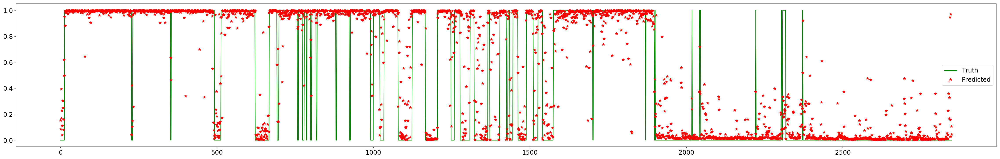

In [22]:
# Plotting predictions
rcParams['figure.figsize'] = 40, 6
plt.plot(Y, "-g", label='Truth');
plt.plot(ypred, '*r', label='Predicted');
plt.legend();

# Plotting Errors

In [23]:
ypred[ypred>0.5] = 1
ypred[ypred<0.5] = 0

!['Types of errors'](https://cdn-images-1.medium.com/max/2000/1*7EYylA6XlXSGBCF77j_rOA.png)

Confusion matrix, without normalization
[[1193  174]
 [  42 1440]]


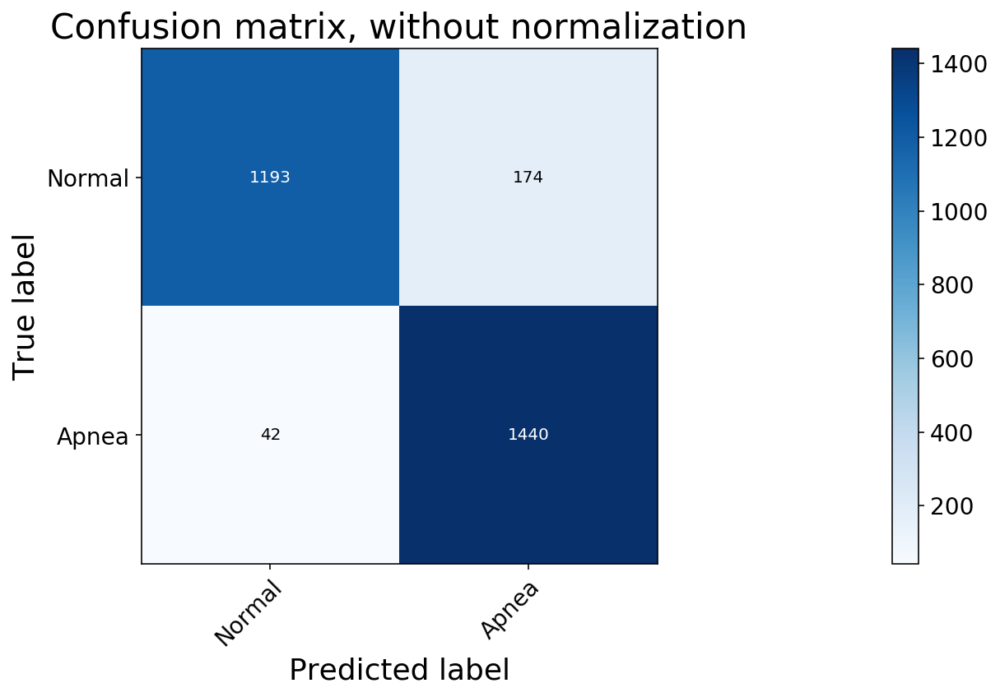

In [24]:
np.set_printoptions(precision=2)
# Plot non-normalized confusion matrix
plot_confusion_matrix(Y, ypred.reshape(-1), classes=['Normal', 'Apnea'], title='Confusion matrix, without normalization');

Normalized confusion matrix
[[0.87 0.13]
 [0.03 0.97]]


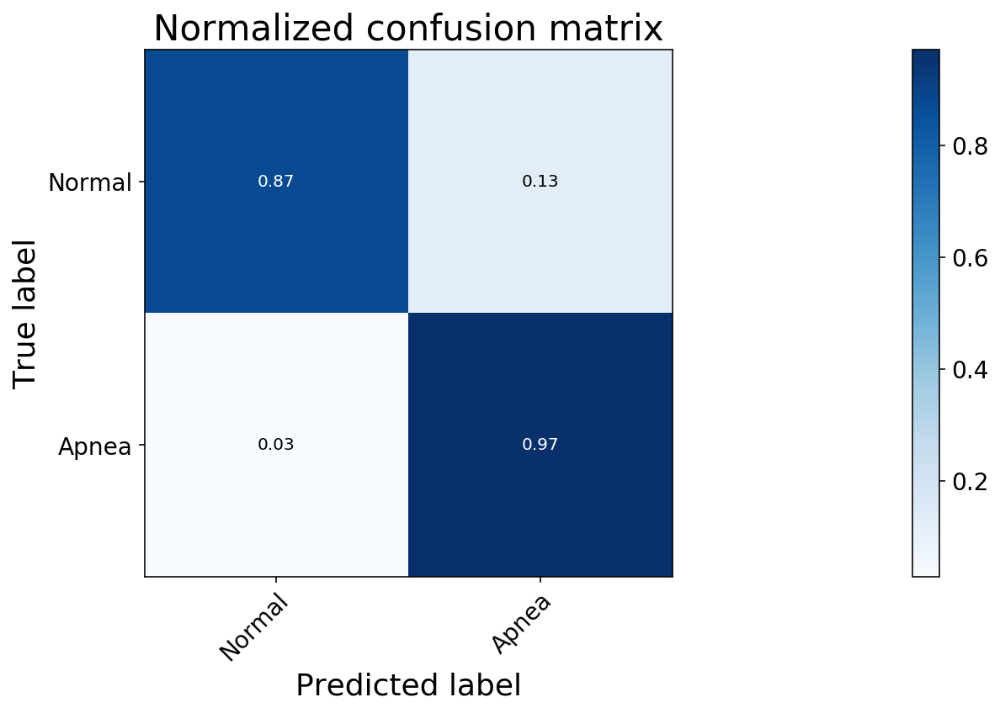

In [26]:
# Plot normalized confusion matrix
plot_confusion_matrix(Y, ypred.reshape(-1), classes=['Normal', 'Apnea'], normalize=True, title='Normalized confusion matrix');

In [27]:
print(classification_report(Y, ypred))

              precision    recall  f1-score   support

         0.0       0.97      0.87      0.92      1367
         1.0       0.89      0.97      0.93      1482

   micro avg       0.92      0.92      0.92      2849
   macro avg       0.93      0.92      0.92      2849
weighted avg       0.93      0.92      0.92      2849



In [28]:
# Let's plot some misclassified samples
indices = np.flatnonzero(Y != ypred.T)

/home/jazzman/anaconda3/lib/python3.6/site-packages/matplotlib/pyplot.py:514: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  max_open_warning, RuntimeWarning)


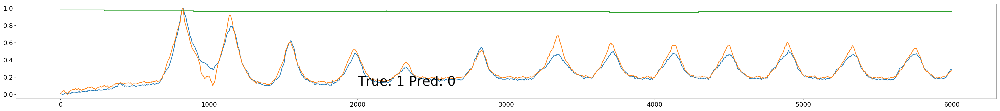

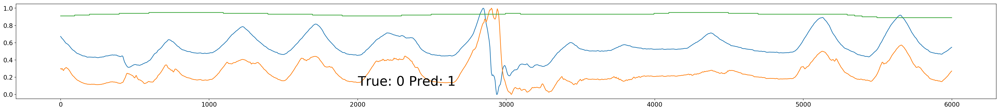

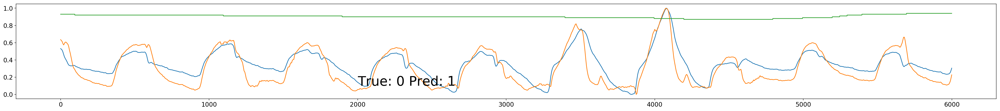

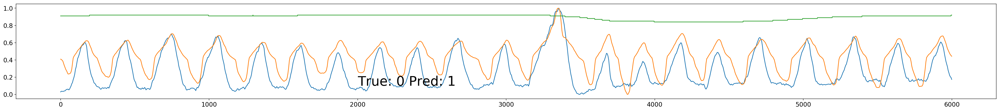

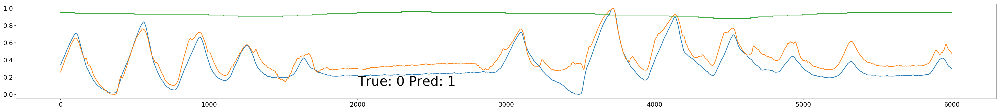

...

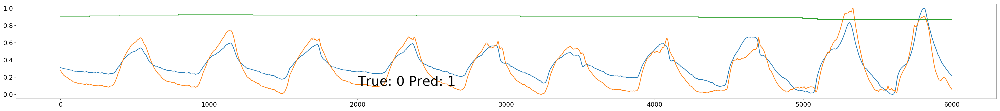

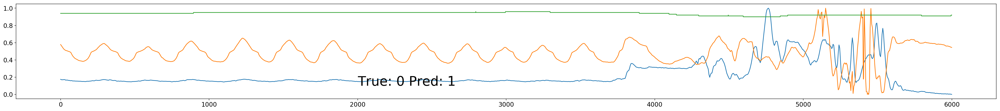

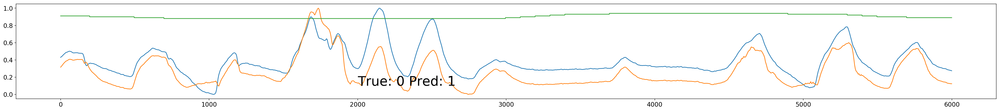

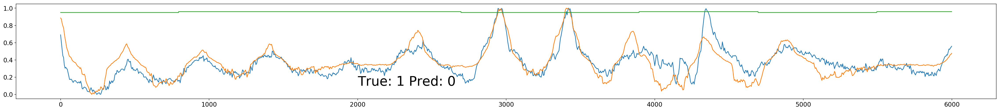

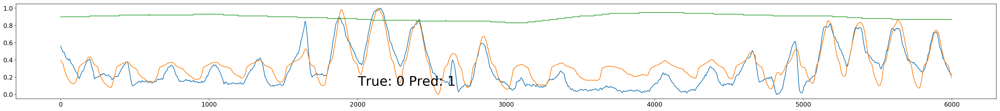

In [30]:

# Grey regions shows dataset was labels for Apnea event
rcParams['figure.figsize'] = 40, 4
for _ in range(40):
    i = np.random.randint(0,len(indices))
    plt.figure()
    plt.plot(X[indices[i]]);
    plt.text(2000,.1, str('True: {}'.format(int(Y[indices[i]]))+ ' Pred: {}'.format(int(ypred[indices[i]]))), fontsize=30);

In [31]:
# Let's save predicted labels for later use in new binary classification model with only one signal from Apnea-ECG dataset
np.save('../apnea_ecg_data/ypred', ypred)

>At this point we have labeled our new dataset (Apnea-ECG) using tranfer knowledge from Apnea/RERA dataset. 
![diagram](../diagram2.png)
> In the last step, we use labels obtained for new dataset and unique signals from a new gadget from the same clinical trial to build supervised ML model for binary classification of the apnea events.
